In [18]:
from lib.notebook_imports import *
import itertools
import scipy.cluster.hierarchy as shc
import prince
from scipy import sparse
import plotly.graph_objects as go

pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_colwidth', None)

%load_ext autoreload
%autoreload 2

shap.initjs()

start_time = datetime.now()


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Read data

In [2]:
from dotenv import load_dotenv
load_dotenv()

True

In [3]:
DATA_PATH = os.environ.get("DATA_PATH")

In [4]:
data_900 = read_data(
    DATA_PATH, 
    merge_with_meds=True, 
    merge_with_patient_genes=True, 
    vcf=False,
    remove_outliers=False)

LGB_PARAMS_BASE, N_FOLDS, ALL_MODEL_SUFFIXES, BASE_COLS_1, BASE_COLS_2, ranking_cols = get_consts()

data_900_df = data_900.input_df.copy()

Converting ds_1_result_num_E2 to float
Converting ds_1_result_num_LH to float
Converting ds_1_result_num_PRG to float
Converting ds_1_result_num_AMH to float
Converting ds_789_result_num_E2 to float
Converting amh_qual_result_num to float
Converting qual_result_num_FSH to float
Converting qual_result_num_DHEAS to float
Converting qual_result_num_Inh_B to float
Converting qual_result_num_TST to float
Converting qual_result_num_anty_TPO to float
Converting qual_result_num_TSH to float
Converting qual_result_num_SHBG to float
weight    0.503356
height    0.492170
bmi       0.460850
dtype: float64
pickups_df:                  981
merged with meds_df:         936
merged with patient_gens_df: 922
merged with poli_changes_df: 922
merged with causes_df: 922
merged with patient_groups_df: 922
merged with body_df: 922

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

In [10]:
genetic_data = read_vcf_files(
    DATA_PATH,
    DATA_PATH+"/vcf/",
)
genome_df, genome_012_cols, hetero_cols, homo_cols, has_alt_cols = prepare_genome_df(genetic_data)
print(f'before merge: {len(data_900_df)}')
data_900_df = data_900_df.merge(genome_df, left_on='__id__', right_on='patient_id', how='inner')
print(f'after merge:  {len(data_900_df)}')
chromosomes = [
    "chr11",
    "chr12",
    "chr14",
    "chr17",
    "chr19",
    "chr2",
    "chr5",
    "chr6",
    "chrX",
]
methods = ['GABRIEL', '4GAM', 'SPINE']
data_900_df, all_block_cols = read_haploview_data(
    DATA_PATH +"/poprawne_vcf_haplotypes/haplotypes/hmap", chromosomes, methods, data_900_df)
gabriel_cols = [col for col in all_block_cols if 'GABRIEL' in col and 'NONE' not in col]
fourgam_cols = [col for col in all_block_cols if '4GAM' in col and 'NONE' not in col]
spine_cols = [col for col in all_block_cols if 'SPINE' in col and 'NONE' not in col]


1
Genome(gt0='A', gt1='G')
1
Genome(gt0='T', gt1='C')
1
Genome(gt0='T', gt1='T')
1
Genome(gt0='G', gt1='G')
1
Genome(gt0='A', gt1='A')
1
Genome(gt0='A', gt1='A')
1
Genome(gt0='A', gt1='G')
1
Genome(gt0='T', gt1='A')
1
Genome(gt0='C', gt1='T')
1
Genome(gt0='G', gt1='A')
1
Genome(gt0='T', gt1='C')
1
Genome(gt0='A', gt1='G')
1
Genome(gt0='A', gt1='G')
1
Genome(gt0='T', gt1='C')
1
Genome(gt0='T', gt1='C')
1
Genome(gt0='A', gt1='C')
1
Genome(gt0='A', gt1='A')
1
Genome(gt0='G', gt1='T')
1
Genome(gt0='G', gt1='A')
1
Genome(gt0='A', gt1='A')
1
Genome(gt0='C', gt1='C')
1
Genome(gt0='C', gt1='C')
1
Genome(gt0='G', gt1='G')
1
Genome(gt0='G', gt1='G')
1
Genome(gt0='C', gt1='C')
1
Genome(gt0='G', gt1='G')
1
Genome(gt0='G', gt1='G')
1
Genome(gt0='C', gt1='C')
1
Genome(gt0='C', gt1='C')
1
Genome(gt0='T', gt1='T')
1
Genome(gt0='A', gt1='G')
1
Genome(gt0='C', gt1='A')
1
Genome(gt0='G', gt1='G')
1
Genome(gt0='A', gt1='ACACACAC')
1
Genome(gt0='C', gt1='C')
1
Genome(gt0='C', gt1='C')
1
Genome(gt0='T', gt

In [11]:
data_900_df['chr2_4GAM_block4_haplotypes_variants'] = ((data_900_df['genome_012_chr2_48962782_C_T']>0)&(data_900_df['genome_012_chr2_48962060_A_G']==0))*1

In [12]:
data_900_df['chr5_4GAM_block2_haplotypes_variants'] = ((data_900_df.loc[:,['genome_012_chr5_35063190_A_T',
 'genome_012_chr5_35064922_C_G',
 'genome_012_chr5_35068146_G_C',
 'genome_012_chr5_35061629_T_C',
 'genome_012_chr5_35069864_G_A',
 'genome_012_chr5_35064413_C_A',
 'genome_012_chr5_35062516_C_T',
 'genome_012_chr5_35065548_C_T']].sum(axis=1)==0))*1

In [13]:
data_900_df['SOM_cols'] = data_900_df[[
    "GDF9_5_132865538_T_C", 
    "GDF9_5_132866205_T_C", 
    "PRL_6_22292747_A_T", 
    "AR_X_67723521_-_CACACAC", 
    "LHCGR_2_48729336_C_T", 
    "FSHB_11_30234435_A_G", 
    "ESR1_6_152061190_A_G", 
    "ESR2_14_64227477_C_T",]].sum(axis = 1)

# Check for correlations in the dataset

In [71]:
class GENES():
    def __init__(
        self,
        cols: list
    ):
        self.ALL_GENES_COLS_900 = cols

In [72]:
gene_columns_test,mwu_less,mwu_greater,ks_less,ks_greater,tests_less,tests_greater = get_statistical_significance(data_900_df,GENES(['genome_012_chr2_48962782_C_T',
    'genome_012_chr2_48962060_A_G',
    'chr2_4GAM_block4_haplotypes_variants',
    'genome_012_chr5_35063190_A_T',
    'genome_012_chr5_35064922_C_G',
    'genome_012_chr5_35068146_G_C',
    'genome_012_chr5_35061629_T_C',
    'genome_012_chr5_35069864_G_A',
    'genome_012_chr5_35064413_C_A',
    'genome_012_chr5_35062516_C_T',
    'genome_012_chr5_35065548_C_T',
    'chr5_4GAM_block2_haplotypes_variants',
    "GDF9_5_132865538_T_C", 
    "GDF9_5_132866205_T_C", 
    "PRL_6_22292747_A_T", 
    "AR_X_67723521_-_CACACAC", 
    "LHCGR_2_48729336_C_T", 
    "FSHB_11_30234435_A_G", 
    "ESR1_6_152061190_A_G", 
    "ESR2_14_64227477_C_T",
    'SOM_cols']))

In [81]:
gene_columns_test[['column_name','mwu_less_p', 'mwu_greater_p']].loc[(gene_columns_test['mwu_less_p']<0.05)|
(gene_columns_test['mwu_greater_p']<0.05)]

,column_name,mwu_less_p,mwu_greater_p
0,genome_012_chr2_48962782_C_T,0.973899,0.026137
2,chr2_4GAM_block4_haplotypes_variants,0.989152,0.010859
3,genome_012_chr5_35063190_A_T,0.968603,0.031428
4,genome_012_chr5_35064922_C_G,0.005620,0.994391
6,genome_012_chr5_35061629_T_C,0.977551,0.022476
12,GDF9_5_132865538_T_C,0.019095,0.980922
13,GDF9_5_132866205_T_C,0.047413,0.952628
16,LHCGR_2_48729336_C_T,0.998966,0.001035
17,FSHB_11_30234435_A_G,0.027136,0.972887
18,ESR1_6_152061190_A_G,0.003831,0.996176


# Basic statistics about the dataset

In [131]:
columns_to_summarize = ["test_amh_r",
    "ds1_pech_licz_10_pon",
    "patient_age",
    "prev_proc-cumulus_denuded",
    'day_0_mii',
    'no.variants']

In [95]:
for column in columns_to_summarize:
    if column not in data_900_df.columns:
        print("{} not in columns".format(column))

prev_proc-miinot in columns


In [115]:
data_900_df["patient_group"].unique()

['2-young_but_low_amh', '3-high_amh', '0-some_group_no_reason', '1-non_standard_stim_response', '4-control_multiple_donors']
Categories (5, object): ['2-young_but_low_amh', '3-high_amh', '0-some_group_no_reason', '1-non_standard_stim_response', '4-control_multiple_donors']

In [122]:
GENOME_COLS = [col for col in data_900_df.columns if col[:6]=='genome']

In [129]:
data_900_df['no.variants'] = ((data_900_df[GENOME_COLS]>0)*1).sum(axis = 1)

,test_amh_r,ds1_pech_licz_10_pon,patient_age,prev_proc-cumulus_denuded,day_0_mii,no.variants
count,200.000000,172.000000,219.000000,125.000000,219.000000,219.000000
mean,3.329050,15.284884,34.196347,9.192000,7.433790,64.789954
std,2.323271,9.086665,5.764713,4.997896,4.300517,13.050421
min,0.450000,0.000000,18.000000,1.000000,1.000000,34.000000
25%,1.347500,9.000000,31.000000,6.000000,4.000000,54.000000
50%,2.885000,12.500000,34.000000,9.000000,7.000000,66.000000
75%,4.155000,20.000000,39.000000,12.000000,10.000000,74.000000
max,11.960000,49.000000,46.000000,24.000000,20.000000,97.000000


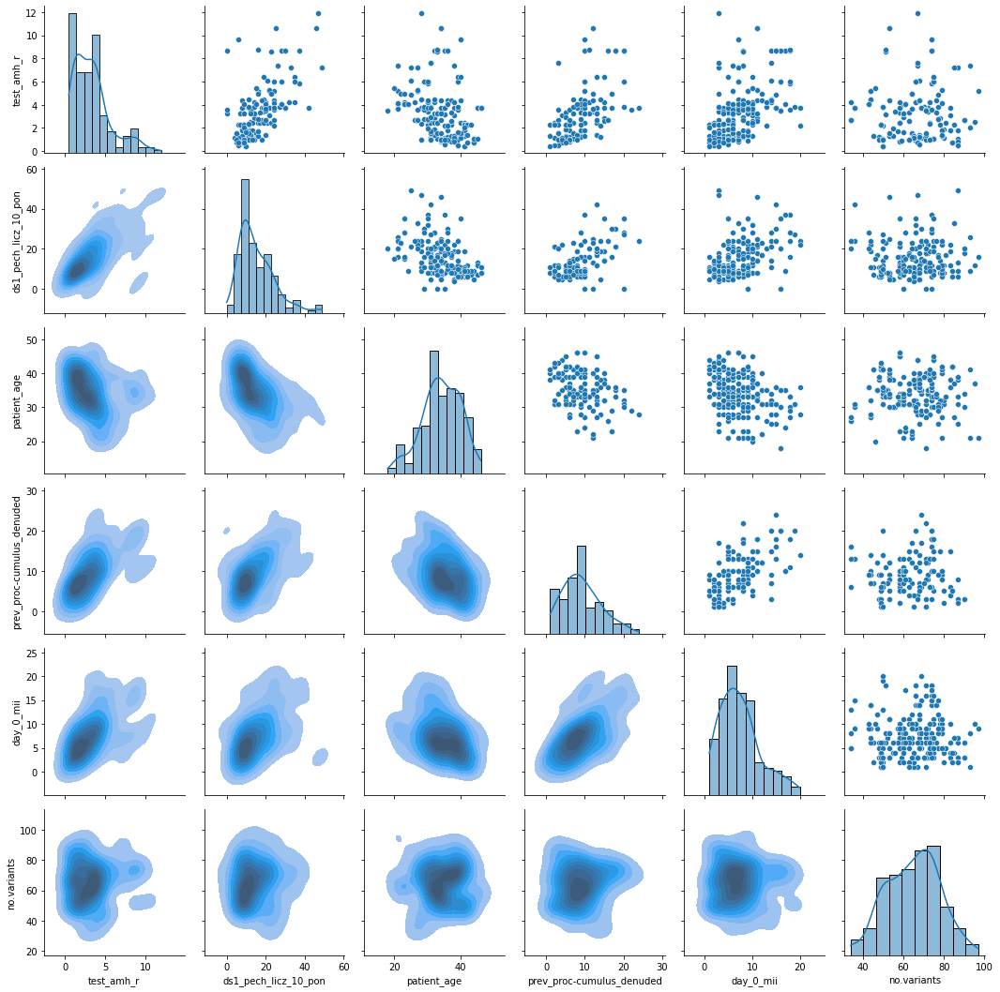

In [132]:
summarize_group(data_900_df[pd.notna(data_900_df['day_0_mii'])],
    columns_to_summarize,group='0-some_group_no_reason')

,test_amh_r,ds1_pech_licz_10_pon,patient_age,prev_proc-cumulus_denuded,day_0_mii,no.variants
count,135.000000,143.000000,159.000000,78.000000,159.000000,159.000000
mean,3.611333,14.797203,33.974843,6.679487,5.459119,66.962264
std,3.701298,11.910204,5.144679,6.205347,4.842771,14.109825
min,0.380000,0.000000,21.000000,0.000000,0.000000,33.000000
25%,1.500000,7.000000,30.000000,2.000000,2.000000,57.000000
50%,2.380000,10.000000,34.000000,5.500000,4.000000,67.000000
75%,4.120000,19.000000,38.000000,8.000000,7.000000,77.500000
max,25.940000,55.000000,46.000000,34.000000,25.000000,98.000000


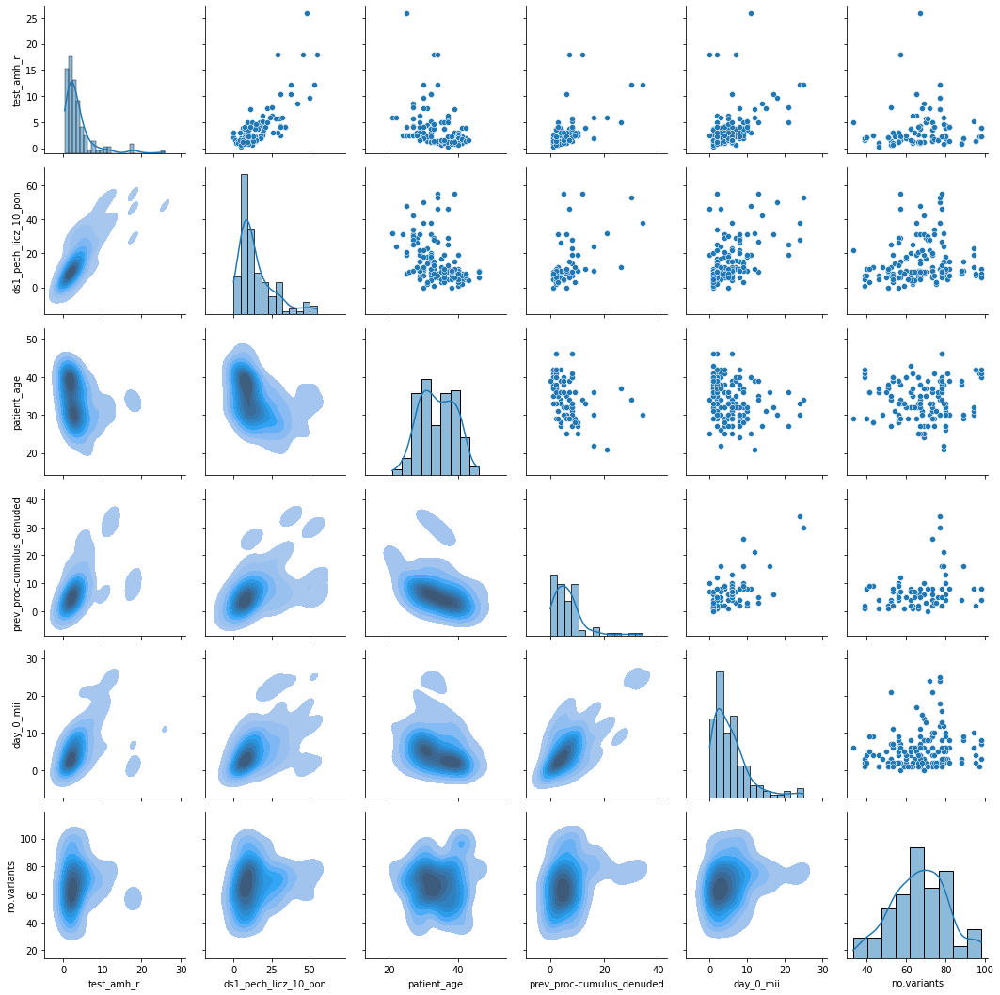

In [133]:
summarize_group(data_900_df[pd.notna(data_900_df['day_0_mii'])],
    columns_to_summarize,group='1-non_standard_stim_response')

,test_amh_r,ds1_pech_licz_10_pon,patient_age,prev_proc-cumulus_denuded,day_0_mii,no.variants
count,154.000000,156.000000,187.000000,90.000000,187.000000,187.000000
mean,0.512532,6.448718,33.893048,4.055556,3.074866,64.700535
std,0.291981,3.016717,2.956550,2.464859,2.181240,14.526807
min,0.020000,0.000000,27.000000,0.000000,0.000000,10.000000
25%,0.370000,5.000000,32.000000,2.000000,2.000000,55.500000
50%,0.500000,6.000000,34.000000,3.500000,3.000000,66.000000
75%,0.590000,8.000000,36.000000,5.000000,4.000000,73.500000
max,1.490000,27.000000,39.000000,11.000000,11.000000,94.000000


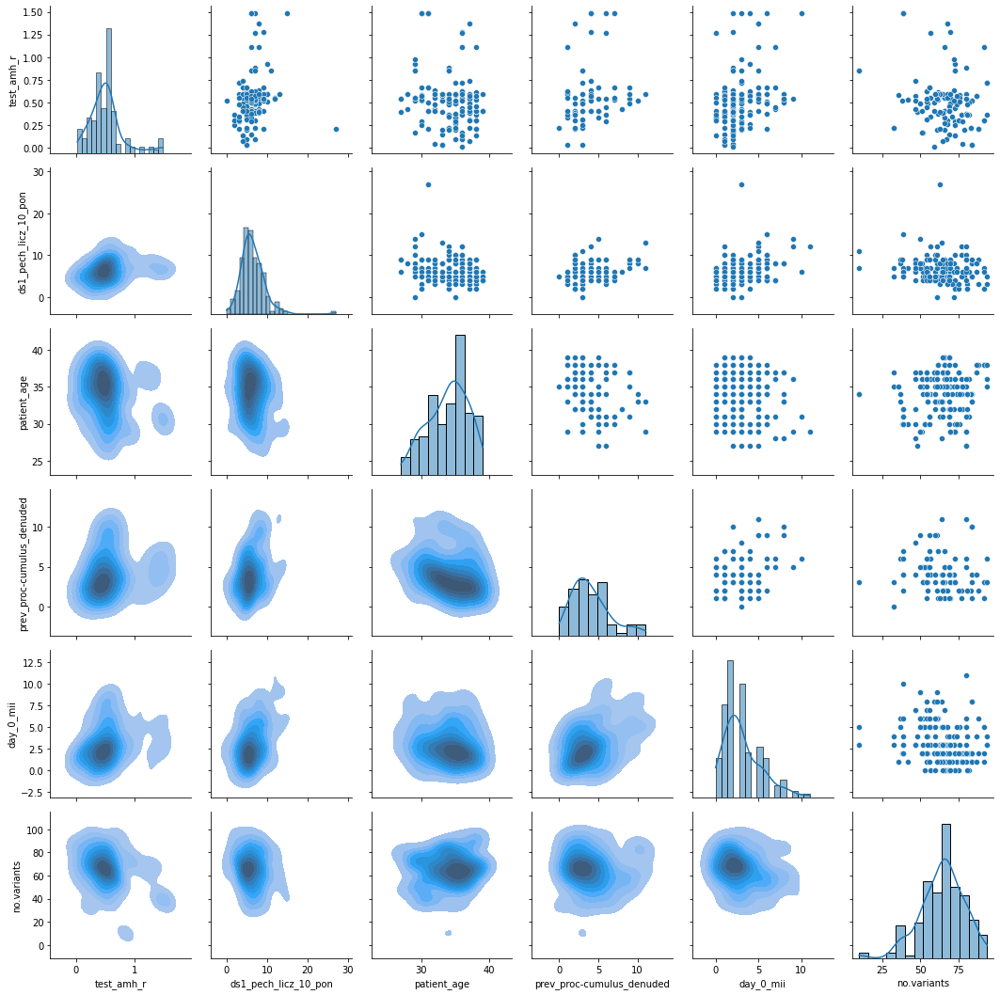

In [134]:
summarize_group(data_900_df[pd.notna(data_900_df['day_0_mii'])],
    columns_to_summarize,group='2-young_but_low_amh')

,test_amh_r,ds1_pech_licz_10_pon,patient_age,prev_proc-cumulus_denuded,day_0_mii,no.variants
count,111.000000,106.000000,132.000000,69.000000,132.000000,132.000000
mean,12.319279,30.320755,32.818182,16.840580,12.462121,64.272727
std,8.076821,15.262495,4.418590,9.241249,7.510202,16.781074
min,2.290000,0.000000,22.000000,2.000000,0.000000,28.000000
25%,8.715000,21.000000,29.000000,11.000000,7.000000,55.000000
50%,10.710000,28.000000,34.000000,15.000000,12.000000,65.000000
75%,12.980000,39.000000,36.000000,21.000000,16.000000,74.000000
max,55.050000,84.000000,39.000000,46.000000,42.000000,104.000000


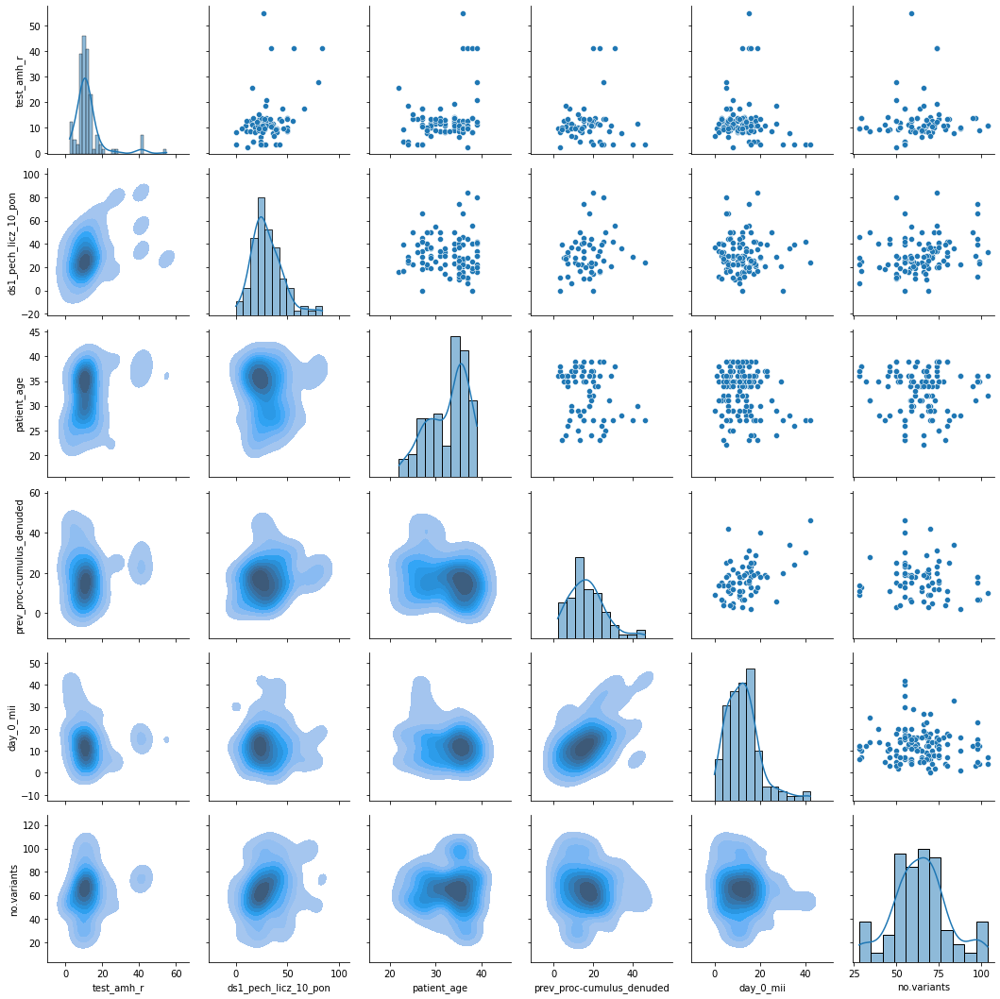

In [135]:
summarize_group(data_900_df[pd.notna(data_900_df['day_0_mii'])],
    columns_to_summarize,group='3-high_amh')

,test_amh_r,ds1_pech_licz_10_pon,patient_age,prev_proc-cumulus_denuded,day_0_mii,no.variants
count,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000
mean,4.384615,18.115385,27.461538,16.923077,10.500000,67.115385
std,1.132739,6.531933,2.485651,6.740463,5.601785,12.294151
min,2.400000,0.000000,22.000000,6.000000,0.000000,30.000000
25%,3.510000,16.000000,26.000000,12.250000,7.250000,59.250000
50%,4.540000,19.000000,28.000000,15.500000,9.000000,68.000000
75%,4.792500,21.750000,29.000000,21.750000,13.750000,76.750000
max,6.950000,30.000000,31.000000,30.000000,22.000000,83.000000


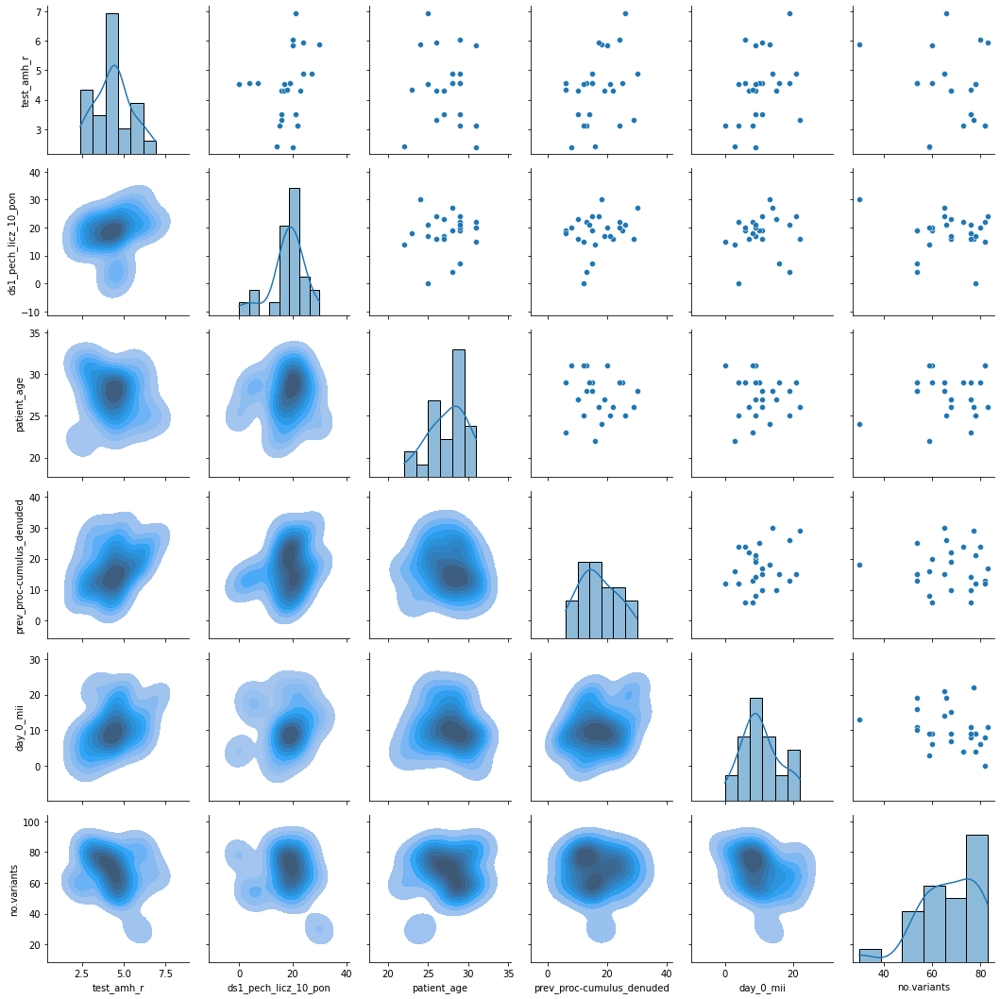

In [136]:
summarize_group(data_900_df[pd.notna(data_900_df['day_0_mii'])],
    columns_to_summarize,group='4-control_multiple_donors')

In [137]:
data_900_df['test_amh_r'].min()

0.02

In [9]:
differences_df = get_differences_df(data_900_df,GENE_COL_SETS)

In [17]:
stim_cols_less_selected = rarest_variants_combinations(data_900_df,differences_df,LGB_PARAMS_BASE)
stim_cols_more_selected = rarest_variants_combinations(data_900_df,differences_df,LGB_PARAMS_BASE,less=False)
destim_cols_less_selected = rarest_variants_combinations(data_900_df,differences_df,LGB_PARAMS_BASE,stim=False)
destim_cols_more_selected = rarest_variants_combinations(data_900_df,differences_df,LGB_PARAMS_BASE,stim=False,less = False)

Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Boolean Series key will be reindexed to match DataFrame index.
Original records: 914
Removed records:  260
Removed records:  0
Removed records:  0
Removed records:  14
Removed records:  92
Removed records:  18
Filtered records: 530
Original records: 914
Removed records:  260
Removed records:  0
Removed records:  0
Removed records:  30
Removed records:  90
Removed records:  18
Filtered records: 516
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
ca

In [18]:
data_900_df['stim_cols_less_selected'] = data_900_df[stim_cols_less_selected].sum(axis = 1)
data_900_df['destim_cols_less_selected'] = data_900_df[destim_cols_less_selected].sum(axis = 1)
data_900_df['destim_cols_more_selected'] = data_900_df[destim_cols_more_selected].sum(axis = 1)
DATA_SERIES_900 = {}
DATA_SERIES_900['900_cumulus_denuded'] = prepare_data_serie(data_900_df, 'cumulus_denuded', N_FOLDS)
DATA_SERIES_900['900_day_0_mii'] = prepare_data_serie(data_900_df, 'day_0_mii', N_FOLDS)

Original records: 914
Removed records:  260
Removed records:  0
Removed records:  0
Removed records:  14
Removed records:  92
Removed records:  18
Filtered records: 530
Original records: 914
Removed records:  260
Removed records:  0
Removed records:  0
Removed records:  30
Removed records:  90
Removed records:  18
Filtered records: 516


Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.
-
RMSE[ test_fold_av

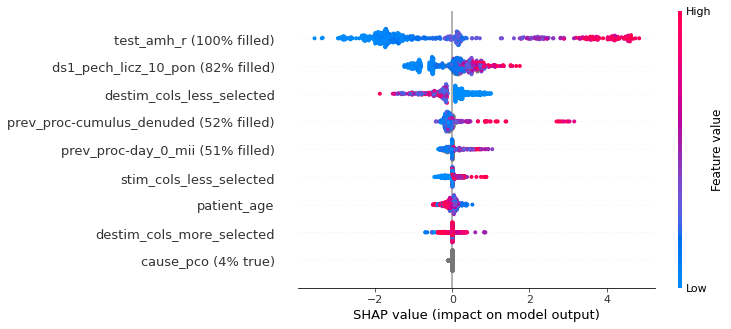

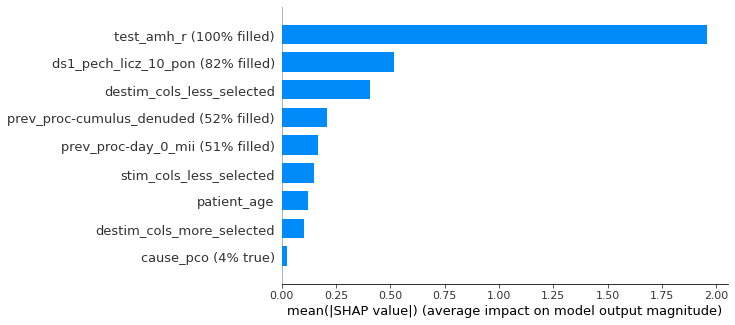

In [19]:
GENE_ADD_COLS = [
    "test_amh_r",
    "ds1_pech_licz_10_pon",
    "patient_age",
    "prev_proc-cumulus_denuded",
    "prev_proc-day_0_mii",
    "cause_pco",            
    'stim_cols_less_selected',
    'destim_cols_less_selected',
    'destim_cols_more_selected'
]
GENE_RESULTS = train_data_series(
    LGB_PARAMS_BASE,
    DATA_SERIES_900,
    GENE_ADD_COLS,
    model_suffixes_filter=['l2'])
GENE_RESULTS.print_errors(
    [GENE_RESULTS],
    print_suffixes=['l2'],
    print_avg=True,
)
shap_vals,all_train_dfs = explain_model(
    GENE_RESULTS,
    data_serie_name='900_day_0_mii',
    model_suffix='l2',
    folds=range(0, N_FOLDS))
GENE_RESULTS_df = GENE_RESULTS.get_merged_test_dfs_from_folds('900_day_0_mii').copy()
GENE_RESULTS_df['error'] = GENE_RESULTS_df['day_0_mii']-GENE_RESULTS_df['prediction_l2']

<AxesSubplot:xlabel='day_0_mii', ylabel='error'>

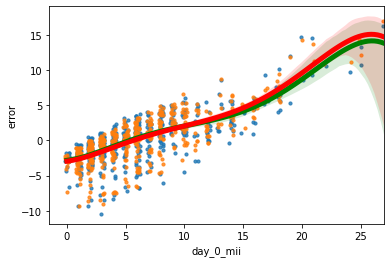

In [20]:
sns.regplot(
    y="error", 
    x="day_0_mii",    
    data=GENE_RESULTS_df,
    x_jitter=.2,
    ci = 95,
    scatter_kws={"s": 10},
    line_kws={'lw':5,
    'color':'green'},
    order=5)
sns.regplot(
    y="error", 
    x="day_0_mii",    
    data=REF_RESULTS_df,
    x_jitter=.2,
    ci = 95,
    scatter_kws={"s": 10},
    line_kws={'lw':5,
    'color':'red'},
    order=5)